In [ ]:
import numpy as np, pandas as pd
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import seaborn as sns


In [ ]:
df = pd.read_csv('airline_churn_synthetic.csv')
df.info()
df.shape
df.head()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   customer_id                      10000 non-null  int64  
 1   Churn                            10000 non-null  int64  
 2   Days_Since_Last_Flight           10000 non-null  int64  
 3   Flights_Last_3_Months            10000 non-null  int64  
 4   Flights_Last_12_Months           10000 non-null  int64  
 5   Travel_Frequency_Trend           10000 non-null  float64
 6   Loyalty_Tier                     10000 non-null  object 
 7   Tier_Downgrade_Indicator         10000 non-null  int64  
 8   Points_Expired                   10000 non-null  int64  
 9   Points_Redeemed_Last_12M         10000 non-null  int64  
 10  Delay_Rate_Percent               10000 non-null  float64
 11  Cancellation_Count               10000 non-null  int64  
 12  Baggage_Mishandling

,customer_id,Churn,Days_Since_Last_Flight,Flights_Last_3_Months,Flights_Last_12_Months,Travel_Frequency_Trend,Loyalty_Tier,Tier_Downgrade_Indicator,Points_Expired,Points_Redeemed_Last_12M,...,Baggage_Mishandling_Count,Support_Ticket_Count_Last_6_12M,Avg_Resolution_Time_Hours,Days_Since_Last_Login,Login_Frequency_Last_90_Days,Total_Spend_Last_6_Months,Refund_Count,Ancillary_Purchase_Count,Disruption_Stress_Score,Engagement_Trend_Index
0,1,0,67,5,17,11.49,Platinum,0,1465,3,...,0,3,16.20,0,17,1353.77,0,4,5.79,18.89
1,2,1,182,1,0,161.01,Bronze,0,10796,0,...,2,14,82.01,129,1,0.00,2,4,112.16,-34.23
2,3,1,432,0,8,-100.00,Bronze,0,10122,1,...,2,14,141.55,191,0,0.00,4,1,110.13,-52.33
3,4,1,392,0,2,-100.00,Silver,1,3708,1,...,1,11,71.24,322,0,0.00,3,5,114.07,-88.22
4,5,1,198,0,8,-100.00,Bronze,0,7884,0,...,5,0,1.51,218,2,32.09,4,0,163.04,-57.50


In [ ]:
# basic checks
assert df.isnull().sum().sum() == 0
assert df['customer_id'].is_unique
df['Churn'].value_counts()

,count
Churn,
0,5000
1,5000


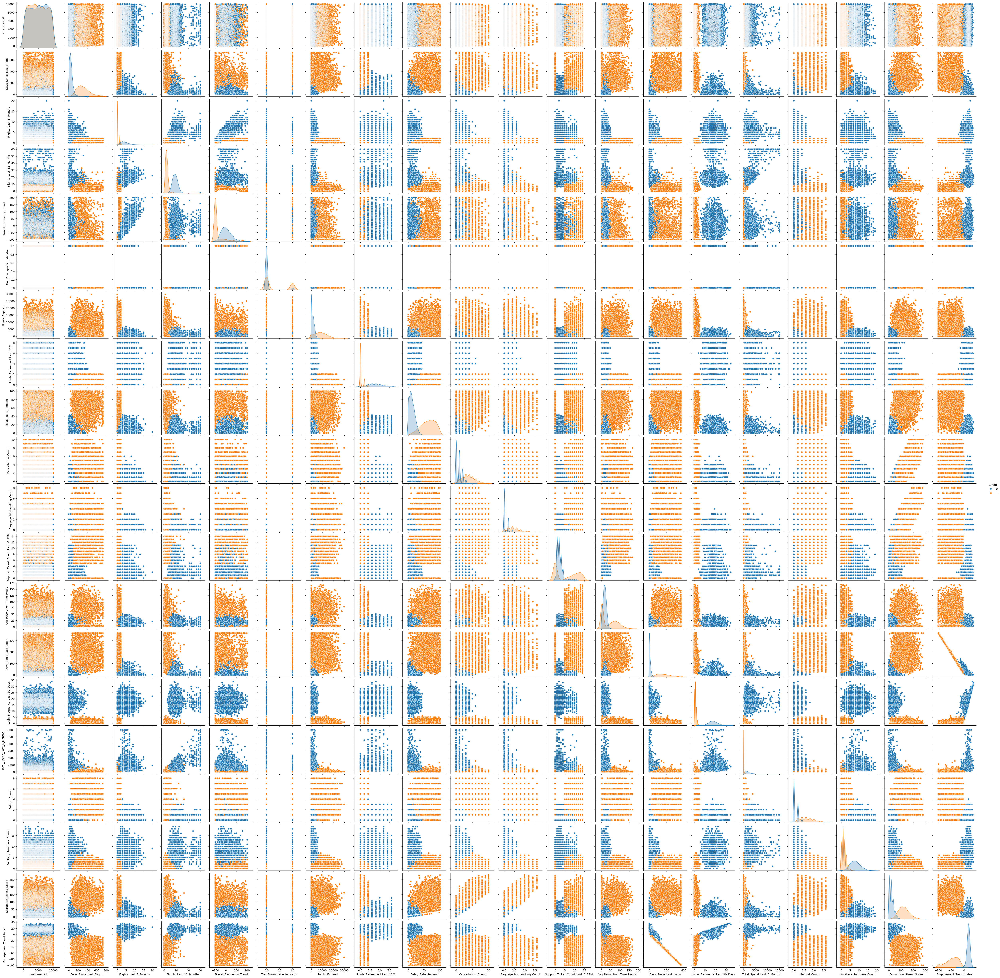

In [ ]:
sns.pairplot(df, hue='Churn')

/tmp/ipython-input-92570310.py:17: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x=col, hue="Churn", fill=True, common_norm=False)


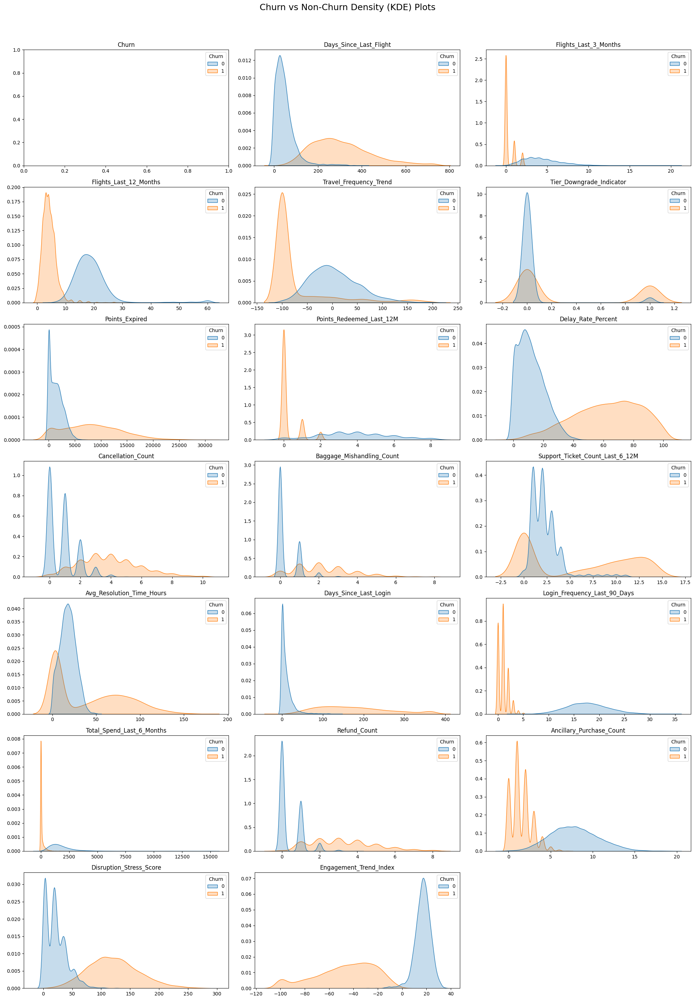

In [ ]:
import math
import seaborn as sns
import matplotlib.pyplot as plt

# Select numeric columns except ID
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
numeric_cols = [col for col in numeric_cols if col not in ["customer_id"]]

# Grid size: 3 columns
n_cols = 3
n_rows = math.ceil(len(numeric_cols) / n_cols)

plt.figure(figsize=(20, n_rows * 4))

for i, col in enumerate(numeric_cols):
    plt.subplot(n_rows, n_cols, i + 1)
    sns.kdeplot(data=df, x=col, hue="Churn", fill=True, common_norm=False)
    plt.title(f"{col}", fontsize=12)
    plt.xlabel("")
    plt.ylabel("")

plt.suptitle("Churn vs Non-Churn Density (KDE) Plots", fontsize=18, y=1.02)
plt.tight_layout()
plt.show()



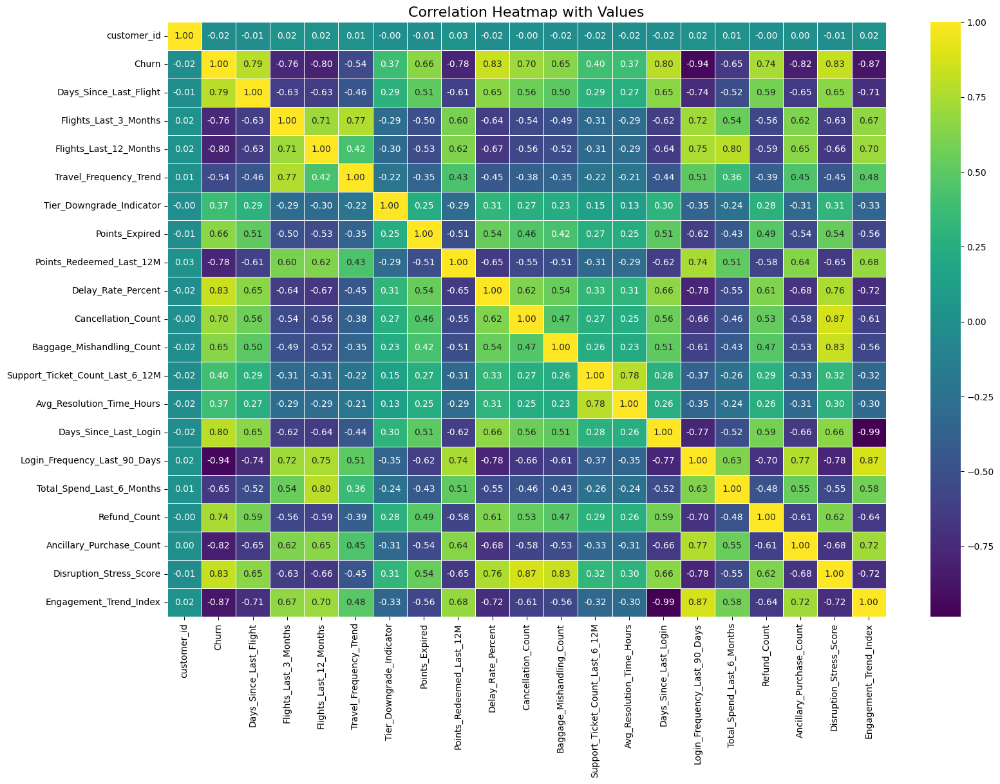

In [ ]:
plt.figure(figsize=(18,12))
corr = df.corr(numeric_only=True)

sns.heatmap(
    corr,
    annot=True,        # <-- show numbers
    fmt=".2f",         # <-- format to 2 decimal places
    cmap="viridis",
    linewidths=0.5,
    cbar=True
)

plt.title("Correlation Heatmap with Values", fontsize=16)
plt.show()



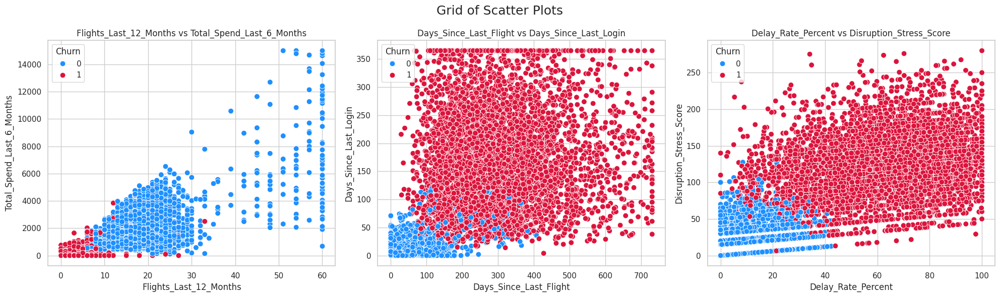

In [ ]:
scatter_pairs = [
    ("Flights_Last_12_Months", "Total_Spend_Last_6_Months"),
    ("Days_Since_Last_Flight", "Days_Since_Last_Login"),
    ("Delay_Rate_Percent", "Disruption_Stress_Score")
]

n_cols = 3
n_rows = 1

plt.figure(figsize=(20, 6))

for i, (x, y) in enumerate(scatter_pairs):
    plt.subplot(1, 3, i+1)
    sns.scatterplot(
        data=df,
        x=x,
        y=y,
        hue="Churn",
        palette=["dodgerblue","crimson"],
        s=60
    )
    plt.title(f"{x} vs {y}", fontsize=12)

plt.suptitle("Grid of Scatter Plots", fontsize=18)
plt.tight_layout()
plt.show()




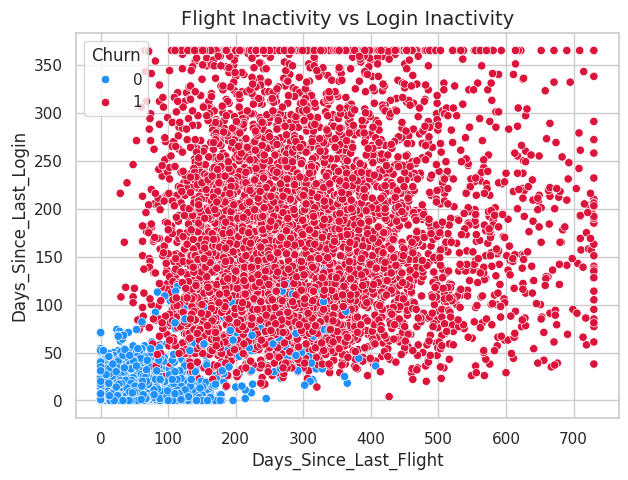

In [ ]:
plt.figure(figsize=(7,5))
sns.scatterplot(
    data=df,
    x="Days_Since_Last_Flight",
    y="Days_Since_Last_Login",
    hue="Churn",
    palette=colors
)
plt.title("Flight Inactivity vs Login Inactivity", fontsize=14)
plt.show()

In [ ]:
import pandas as pd

train_df = pd.read_csv("airline_churn_synthetic.csv")
test_df  = pd.read_csv("test_dataset_200.csv")

X_train = train_df.drop(columns=["customer_id", "Churn"])
y_train = train_df["Churn"]

X_test = test_df.drop(columns=["customer_id", "Churn"])
y_test = test_df["Churn"]


KeyError: "['customer_id'] not found in axis"

In [ ]:
X

Atul


In [ ]:
# Cell 1 - Imports & basic settings
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import (
    roc_auc_score, roc_curve,
    confusion_matrix, classification_report,
    precision_recall_fscore_support, accuracy_score
)

import xgboost as xgb
import joblib

RANDOM_STATE = 42


In [ ]:
import pandas as pd

train_df = pd.read_csv("airline_churn_synthetic.csv")
test_df  = pd.read_csv("airline_churn_subtle_final_200.csv")

X_train = train_df.drop(columns=["customer_id", "Churn"])
y_train = train_df["Churn"]

X_test = test_df.drop(columns=["customer_id", "Churn"])
y_test = test_df["Churn"]

In [ ]:
# Cell 3 - Quick checks
print("Shape:", train_df.shape)
print(train_df['Churn'].value_counts(normalize=True).rename('proportion'))
display(train_df.info())
display(train_df.describe().T)


Shape: (10000, 22)
Churn
0    0.5
1    0.5
Name: proportion, dtype: float64
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   customer_id                      10000 non-null  int64  
 1   Churn                            10000 non-null  int64  
 2   Days_Since_Last_Flight           10000 non-null  int64  
 3   Flights_Last_3_Months            10000 non-null  int64  
 4   Flights_Last_12_Months           10000 non-null  int64  
 5   Travel_Frequency_Trend           10000 non-null  float64
 6   Loyalty_Tier                     10000 non-null  object 
 7   Tier_Downgrade_Indicator         10000 non-null  int64  
 8   Points_Expired                   10000 non-null  int64  
 9   Points_Redeemed_Last_12M         10000 non-null  int64  
 10  Delay_Rate_Percent               10000 non-null  float64
 11  Cance

None

,count,mean,std,min,25%,50%,75%,max
customer_id,10000.0,5000.500000,2886.895680,1.0,2500.7500,5000.500,7500.2500,10000.00
Churn,10000.0,0.500000,0.500025,0.0,0.0000,0.500,1.0000,1.00
Days_Since_Last_Flight,10000.0,176.264700,164.532478,0.0,37.0000,124.000,287.0000,730.00
Flights_Last_3_Months,10000.0,2.358100,2.649409,0.0,0.0000,2.000,4.0000,20.00
Flights_Last_12_Months,10000.0,11.695600,9.326159,0.0,4.0000,10.000,18.0000,60.00
Travel_Frequency_Trend,10000.0,-33.019837,68.462447,-100.0,-100.0000,-40.520,12.0325,200.00
Tier_Downgrade_Indicator,10000.0,0.190800,0.392951,0.0,0.0000,0.000,0.0000,1.00
Points_Expired,10000.0,4847.222500,5266.811864,0.0,794.0000,2631.000,8005.0000,29705.00
Points_Redeemed_Last_12M,10000.0,2.058500,2.299871,0.0,0.0000,1.000,4.0000,8.00
Delay_Rate_Percent,10000.0,37.069848,30.346101,0.0,10.2800,26.515,64.1325,100.00


In [ ]:
X = train_df.drop(columns=['customer_id', 'Churn']).copy()
y = train_df['Churn'].copy()

# Identify categorical & numeric columns
cat_cols = ['Loyalty_Tier']
num_cols = [c for c in X.columns if c not in cat_cols]

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler

preprocessor = ColumnTransformer(transformers=[
    ('num', StandardScaler(), num_cols),
    ('cat', OneHotEncoder(drop='first', sparse_output=False), cat_cols)
])


In [ ]:
# Cell 5 - Train-test split
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.25, stratify=y, random_state=RANDOM_STATE
)

print("Train shape:", X_train.shape, "Test shape:", X_test.shape)
print("Train churn distribution:\n", y_train.value_counts(normalize=True))


Train shape: (7500, 20) Test shape: (200, 20)
Train churn distribution:
 Churn
1    0.5
0    0.5
Name: proportion, dtype: float64


In [ ]:
xgb_model = xgb.XGBClassifier(
    objective="binary:logistic",
    eval_metric="logloss",
    random_state=42,
    n_estimators=300,
    max_depth=4,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    verbosity=1    # XGBoost internal logging
)

pipeline = Pipeline(steps=[
    ("pre", preprocessor),
    ("model", xgb_model)
])

# Use fit(verbose=1) for training logs
pipeline.fit(X_train, y_train, model__verbose=1)


Pipeline(steps=[('pre',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['Days_Since_Last_Flight',
                                                   'Flights_Last_3_Months',
                                                   'Flights_Last_12_Months',
                                                   'Travel_Frequency_Trend',
                                                   'Tier_Downgrade_Indicator',
                                                   'Points_Expired',
                                                   'Points_Redeemed_Last_12M',
                                                   'Delay_Rate_Percent',
                                                   'Cancellation_Count',
                                                   'Baggage_Mishandling_Count',
                                                   'Support_Ticket_Count_Last_6_1...
                               feature_types=None, feature_weights=None,
                               gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=0.1,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=4, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=300, n_jobs=None,
                               num_parallel_tree=None, ...))])

In [ ]:
# Save to pickle
import pickle

with open("xgb_model.pkl", "wb") as f:
    pickle.dump(pipeline, f)

print("Model saved to xgb_model.pkl")

Model saved to xgb_model.pkl


In [ ]:
import pickle
import numpy as np

# Load the model
with open("xgb_model.pkl", "rb") as f:
    loaded_model = pickle.load(f)

# Example prediction
prediction = loaded_model.predict(X_test)

print("Prediction:", prediction)


Prediction: [1 1 1 0 0 0 1 0 0 1 0 0 0 1 0 0 1 0 0 1 0 1 0 1 1 1 1 0 0 0 1 1 1 1 0 0 0
 0 0 1 1 0 1 1 0 0 0 1 0 1 0 0 1 0 0 1 0 1 0 0 0 1 0 1 1 0 1 0 1 0 1 0 0 1
 0 0 1 0 0 0 1 1 1 0 0 0 0 1 0 1 1 0 0 1 1 0 0 1 1 0 0 1 0 0 0 0 1 1 0 0 0
 1 0 0 1 0 1 1 0 1 1 0 0 0 1 1 0 0 1 1 0 1 1 0 1 0 1 0 1 0 0 0 0 1 1 1 1 0
 1 1 0 0 1 1 1 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 1 1 1 1 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 1 0 1 0 1 1 0 0]


In [ ]:
y_val_pred = pipeline.predict(X_val)
y_val_proba = pipeline.predict_proba(X_val)[:, 1]

print("=== VALIDATION METRICS ===")
print("AUC:", roc_auc_score(y_val, y_val_proba))
print(classification_report(y_val, y_val_pred))

y_test_pred = pipeline.predict(X_test)
y_test_proba = pipeline.predict_proba(X_test)[:, 1]

print("=== TEST METRICS ===")
print("AUC:", roc_auc_score(y_test, y_test_proba))
print(classification_report(y_test, y_test_pred))


=== VALIDATION METRICS ===
AUC: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1250
           1       1.00      1.00      1.00      1250

    accuracy                           1.00      2500
   macro avg       1.00      1.00      1.00      2500
weighted avg       1.00      1.00      1.00      2500

=== TEST METRICS ===
AUC: 0.9959
              precision    recall  f1-score   support

           0       0.88      1.00      0.93       100
           1       1.00      0.86      0.92       100

    accuracy                           0.93       200
   macro avg       0.94      0.93      0.93       200
weighted avg       0.94      0.93      0.93       200



In [ ]:
data = list(zip(y_test_pred, y_test_proba))

# Create the DataFrame, specifying column names
test = pd.DataFrame(data, columns=['Pred', 'Probability'])
test

,Pred,Probability
0,1,0.992645
1,1,0.997842
2,1,0.999412
3,0,0.003441
4,0,0.000320
...,...,...
195,0,0.000483
196,1,0.724283
197,1,0.997399
198,0,0.000268


In [ ]:
test_df.head(2)

,customer_id,Churn,Flights_Last_12_Months,Flights_Last_3_Months,Days_Since_Last_Flight,Travel_Frequency_Trend,Loyalty_Tier,Tier_Downgrade_Indicator,Points_Expired,Points_Redeemed_Last_12M,...,Baggage_Mishandling_Count,Support_Ticket_Count_Last_6_12M,Avg_Resolution_Time_Hours,Days_Since_Last_Login,Login_Frequency_Last_90_Days,Total_Spend_Last_6_Months,Refund_Count,Ancillary_Purchase_Count,Disruption_Stress_Score,Engagement_Trend_Index
0,30001,1,15,2,84,-86.23,Silver,1,8607,0,...,2,0,4.83,173,5,449.11,1,2,98.99,-41.84
1,30002,1,12,2,102,-64.37,Silver,1,8746,0,...,1,0,0.99,111,1,548.76,1,1,45.41,-29.30


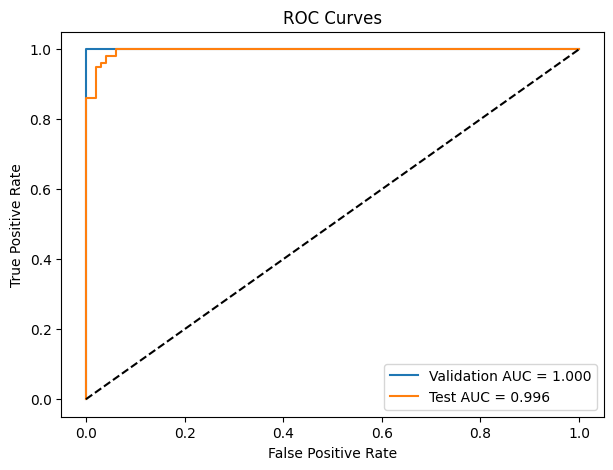

In [ ]:
plt.figure(figsize=(7,5))

# Validation ROC
fpr_val, tpr_val, _ = roc_curve(y_val, y_val_proba)
plt.plot(fpr_val, tpr_val, label=f"Validation AUC = {roc_auc_score(y_val, y_val_proba):.3f}")

# Test ROC
fpr_test, tpr_test, _ = roc_curve(y_test, y_test_proba)
plt.plot(fpr_test, tpr_test, label=f"Test AUC = {roc_auc_score(y_test, y_test_proba):.3f}")

plt.plot([0,1], [0,1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves")
plt.legend()
plt.show()


In [ ]:
test_churn = test_df[test_df["Churn"] == 1].reset_index(drop=True)
test_nonchurn = test_df[test_df["Churn"] == 0].reset_index(drop=True)

print("Churn customers:", test_churn.shape)
print("Non-Churn customers:", test_nonchurn.shape)


Churn customers: (100, 22)
Non-Churn customers: (100, 22)


Test Data Analysis

/tmp/ipython-input-3811708617.py:17: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x=col, hue="Churn", fill=True, common_norm=False)


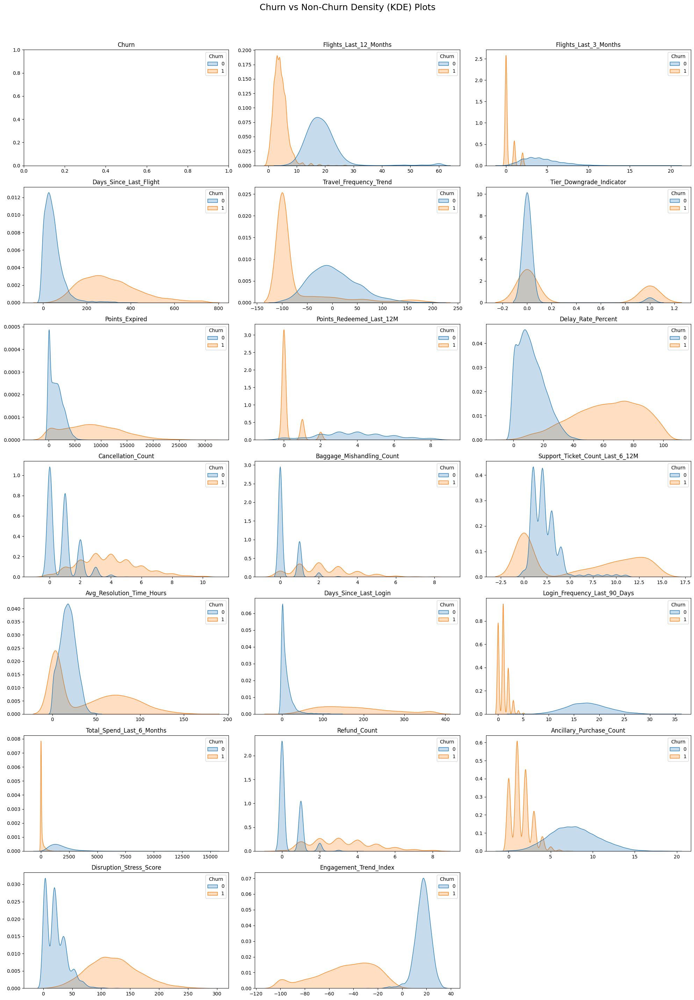

In [ ]:
import math
import seaborn as sns
import matplotlib.pyplot as plt

# Select numeric columns except ID
numeric_cols = test_df.select_dtypes(include=['int64', 'float64']).columns
numeric_cols = [col for col in numeric_cols if col not in ["customer_id"]]

# Grid size: 3 columns
n_cols = 3
n_rows = math.ceil(len(numeric_cols) / n_cols)

plt.figure(figsize=(20, n_rows * 4))

for i, col in enumerate(numeric_cols):
    plt.subplot(n_rows, n_cols, i + 1)
    sns.kdeplot(data=df, x=col, hue="Churn", fill=True, common_norm=False)
    plt.title(f"{col}", fontsize=12)
    plt.xlabel("")
    plt.ylabel("")

plt.suptitle("Churn vs Non-Churn Density (KDE) Plots", fontsize=18, y=1.02)
plt.tight_layout()
plt.show()

In [ ]:
test_churn.describe()

,customer_id,Churn,Flights_Last_12_Months,Flights_Last_3_Months,Days_Since_Last_Flight,Travel_Frequency_Trend,Tier_Downgrade_Indicator,Points_Expired,Points_Redeemed_Last_12M,Delay_Rate_Percent,...,Baggage_Mishandling_Count,Support_Ticket_Count_Last_6_12M,Avg_Resolution_Time_Hours,Days_Since_Last_Login,Login_Frequency_Last_90_Days,Total_Spend_Last_6_Months,Refund_Count,Ancillary_Purchase_Count,Disruption_Stress_Score,Engagement_Trend_Index
count,100.000000,100.0,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,...,100.000000,100.00000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000
mean,30098.990000,1.0,8.090000,1.250000,170.560000,-45.405700,0.310000,6618.940000,0.500000,53.996600,...,1.620000,3.60000,28.164100,119.730000,3.930000,723.49760,2.310000,1.400000,99.148900,-28.480600
std,58.123605,0.0,6.562974,1.919464,93.513821,66.243533,0.464823,4075.574957,0.797724,22.141109,...,1.204201,4.52825,31.456378,69.093387,2.972109,2165.07276,1.315755,1.154701,35.832058,18.992665
min,30001.000000,1.0,0.000000,0.000000,0.000000,-100.000000,0.000000,0.000000,0.000000,10.850000,...,0.000000,0.00000,0.630000,10.000000,0.000000,0.00000,0.000000,0.000000,8.040000,-84.610000
25%,30047.750000,1.0,4.000000,0.000000,105.000000,-100.000000,0.000000,3949.250000,0.000000,35.200000,...,1.000000,0.00000,4.002500,69.750000,2.000000,0.00000,1.000000,1.000000,74.885000,-41.472500
50%,30098.500000,1.0,6.000000,1.000000,163.500000,-66.660000,0.000000,6300.000000,0.000000,55.745000,...,1.500000,0.00000,6.910000,108.500000,4.000000,259.32000,2.000000,1.000000,101.095000,-24.605000
75%,30149.250000,1.0,9.000000,2.000000,235.750000,-3.877500,1.000000,9237.250000,1.000000,71.995000,...,2.000000,7.00000,54.750000,167.250000,5.000000,500.45250,3.000000,2.000000,125.710000,-13.910000
max,30198.000000,1.0,39.000000,13.000000,444.000000,200.000000,1.000000,22990.000000,3.000000,100.000000,...,6.000000,13.00000,118.440000,321.000000,20.000000,12616.91000,6.000000,5.000000,182.980000,3.670000


In [ ]:
test_nonchurn.describe()

,customer_id,Churn,Flights_Last_12_Months,Flights_Last_3_Months,Days_Since_Last_Flight,Travel_Frequency_Trend,Tier_Downgrade_Indicator,Points_Expired,Points_Redeemed_Last_12M,Delay_Rate_Percent,...,Baggage_Mishandling_Count,Support_Ticket_Count_Last_6_12M,Avg_Resolution_Time_Hours,Days_Since_Last_Login,Login_Frequency_Last_90_Days,Total_Spend_Last_6_Months,Refund_Count,Ancillary_Purchase_Count,Disruption_Stress_Score,Engagement_Trend_Index
count,100.000000,100.0,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,...,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.00000,100.000000,100.00000,100.000000
mean,30102.010000,0.0,14.010000,3.640000,51.980000,15.165100,0.030000,1329.600000,3.750000,18.186800,...,0.520000,1.770000,17.551900,21.15000,15.040000,978.699800,0.83000,6.800000,35.50590,9.994400
std,57.886775,0.0,6.061128,2.611242,48.010517,68.355524,0.171447,1067.417122,2.090744,13.061882,...,0.893071,1.013594,9.984735,27.96801,7.166025,659.540737,0.93263,2.534609,30.70783,8.086468
min,30004.000000,0.0,0.000000,0.000000,0.000000,-100.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,0.00000,0.000000,0.000000,0.00000,2.000000,0.00000,-20.060000
25%,30053.500000,0.0,11.750000,2.000000,21.750000,-27.945000,0.000000,381.000000,2.000000,7.725000,...,0.000000,1.000000,8.922500,3.00000,12.000000,457.160000,0.00000,5.000000,17.74750,7.625000
50%,30103.500000,0.0,15.000000,3.500000,35.000000,9.505000,0.000000,1270.500000,3.500000,15.065000,...,0.000000,2.000000,17.475000,10.00000,14.000000,882.530000,1.00000,7.000000,32.13500,11.070000
75%,30151.250000,0.0,17.000000,5.000000,63.500000,55.972500,0.000000,1936.750000,5.000000,26.800000,...,1.000000,2.000000,25.042500,26.25000,17.000000,1330.805000,1.00000,8.000000,43.10000,15.287500
max,30200.000000,0.0,43.000000,14.000000,226.000000,200.000000,1.000000,4294.000000,9.000000,49.840000,...,6.000000,4.000000,40.580000,130.00000,52.000000,2937.830000,4.00000,15.000000,180.53000,25.280000
